#Introduction of the Project
This article is divided into the following four parts
- Data loading and data preprocessing
- Data visualization, data preprocessing
- LightGBM builds a housing price prediction model
- Neural networks build house price prediction models

Data source:github

In [2]:
#Import the module
import datetime
from datetime import datetime
from math import sqrt
import numpy as np
import pandas as pd
from numpy import concatenate
import folium
import lightgbm as lgb
from folium.plugins import HeatMap
from keras.models import Sequential
from keras import backend as K
from keras.wrappers.scikit_learn import KerasRegressor
from keras.layers.core import Dense, Dropout, Activation
from keras.optimizers import Adam
from keras.layers.embeddings import Embedding
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error
from scipy import stats
from scipy.stats import norm, skew 
import plotly_express as px
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.style.use('ggplot')

import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
sns.set(rc={'figure.figsize':(25,15)})

import plotly
plotly.offline.init_notebook_mode(connected=True)
import plotly.graph_objs as go

import plotly.figure_factory as ff

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
# Show all columns
pd.set_option('display.max_columns', None)
# Show all rows
pd.set_option('display.max_rows', None)
#设置value的显示长度为50
pd.set_option('max_colwidth',50)

Using TensorFlow backend.


There are a total of 5 tables in this excel dataset. 1 table shows all listings in 4 cities. The remaining four tables count the neighborhood information of the four cities, and the characteristic variables of the data in these four tables are the same, so we can combine them vertically. In addition, the 'city' and 'tube_name' features in these 4 neighborhood information tables are duplicated with the listing information table, but the 'tube_name' in the neighborhood information table lacks the city prefix, so we follow the following process to process and merge the tables in the dataset.

- Merge the 4 neighborhood information tables vertically to obtain the dataset 'DFF'
- Merge the characters of the features 'city' and 'tube_name' of the block data in the dataset 'dff' and store them in the feature 'tube_name'
- Merge the neighborhood information dataset 'DF' and the listing information dataset 'DF', and the merged parent node is the feature 'tube_name' to obtain a new dataset 'data'
- Change the easily modifiable Chinese characters in 'data' to letters to avoid matplotlib plot display errors as much as possible
- LightGBM adds decision rules for category features to the decision tree algorithm, which can directly process the category features in numeric form and is more advanced than the traditional single-hot coding algorithms, so we can encode the category features normally

In [3]:
# Read the dataset
df = pd.read_excel('data.xlsx',sheet_name=4)
df0 = pd.read_excel('data.xlsx',sheet_name=0)
df1 = pd.read_excel('data.xlsx',sheet_name=1)
df2 = pd.read_excel('data.xlsx',sheet_name=2)
df3 = pd.read_excel('data.xlsx',sheet_name=3)
# Data Merging
dff = pd.concat([df0,df1,df2,df3])
# Data preprocessing
dff["tube_name"] = dff["city"] + dff["tube_name"]
dff.drop(labels=['city'],axis=1,inplace=True)
# Data Merging
data = pd.merge(df,dff,on="tube_name")
                
data.rename(columns={'租金中位数（元/月）':'area_price_level', '居住便利度':'convenience', 'tube_distance（m）':'tube_distance'},inplace = True)

In [4]:
# This code converts the Chinese of the city name in the original data to the corresponding English name,
# and saves the result in a new column city_cn.
data['city_cn']=data['city']
data.city[data.city=='上海'] = 'shanghai'
data.city[data.city=='广州'] = 'guangzhou'
data.city[data.city=='北京'] = 'beijing'
data.city[data.city=='深圳'] = 'shenzhen'

In [5]:
# Feature coding for dataset categories
lb=LabelEncoder()
data['city_encode'] = lb.fit_transform(data['city'].values)
data['floor_encode'] = lb.fit_transform(data['floor'].values)
data['towards_encode'] = lb.fit_transform(data['towards'].values)

In [6]:
data.head(3)

,ID,city,floor,rent_room,towards,latitude,longitude,price_area,room_no,tube_distance,tube_name,area_price_level,convenience,city_cn,city_encode,floor_encode,towards_encode
0,29,shanghai,低楼层,5000.000000,南,31.239668,121.471921,151.515152,2,659.543339,上海人民广场,8666.666667,93.985965,上海,2,1,22
1,22614,shanghai,低楼层,3600.000000,南,31.231730,121.468079,180.000000,1,481.771180,上海人民广场,8666.666667,93.985965,上海,2,1,22
2,22619,shanghai,中楼层,4833.333333,南,31.238967,121.470462,105.839416,3,552.412127,上海人民广场,8666.666667,93.985965,上海,2,0,22


## Visualize my data

First, let's look at the size of the property, the rent, and the distribution of the city

In [7]:
# Create a scatter plot based on house prices, rents, and conveniences in the dataset, where colors represent
# different cities and the size of the dots indicates convenience.
px.scatter(data,x="price_area",y="rent_room",color='city_cn',size="convenience",size_max=6)

We noticed that there are some outliers in the housing data of the rent of less than 1000 yuan, most of these housing areas are greater than 100 square meters,
which is extremely abnormal in the first-tier cities, these abnormal housing information is basically located in Guangzhou and Shenzhen, considering that the first-tier cities may also have individual locations that are very remote,
let's check the distribution of housing in Guangzhou and Shenzhen to see if it is possible that this situation is caused

In [8]:
px.scatter(data[(data['city']=='guangzhou')|(data['city']=='shenzhen')],x="price_area",y="rent_room",color='tube_name',size="convenience",size_max=6)

It can be seen that these houses with large areas but unreasonably low prices are scattered in various areas,
indicating that this phenomenon is not caused by geographical location, combined with the actual situation,
 we infer that these unreasonable housing information may be false advertisements placed by some intermediaries to attract renters to contact agents at ultra-low prices.
As can be seen from the images,
the area of these false listings is usually more than 60 square meters, and the rent is usually less than 1000 yuan, which is not possible in the first-tier cities in China

In [9]:
# Removed row data in dDataFrame that did not meet the criteria.
test=data[(data.rent_room<=1000)&(data.price_area>=70)]

drop1=[x for i,x in enumerate(data.index) if (data['rent_room'].iloc[i]<=1000)&(data['price_area'].iloc[i]>=60)]

data=data.drop(drop1,axis=0) 

Next, we plot a scatter plot matrix and a correlation matrix to see the approximate relationship and distribution between features

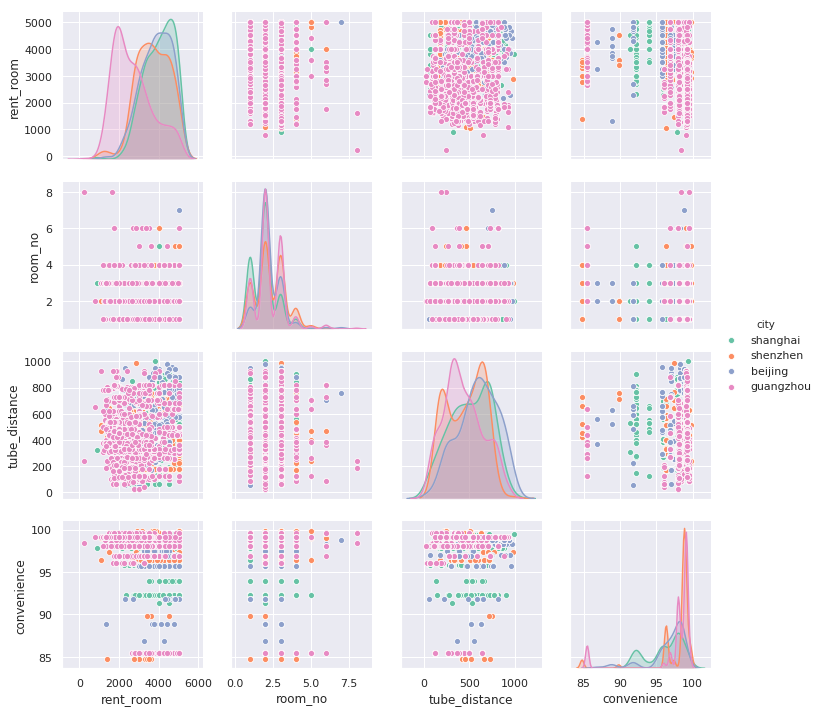

In [10]:
# A pairwise diagram was created to visualize the relationship between the pairs of variables in the dataset. Each point in the graph represents a sample in the dataset,
# and the different colors represent different cities.
p = sns.pairplot(pd.DataFrame(list(zip(data['rent_room'], data['city'], data['room_no'], data['tube_distance'], data['convenience'])), 
                        columns=['rent_room','city', 'room_no', 'tube_distance', 'convenience']), hue='city', palette="Set2")

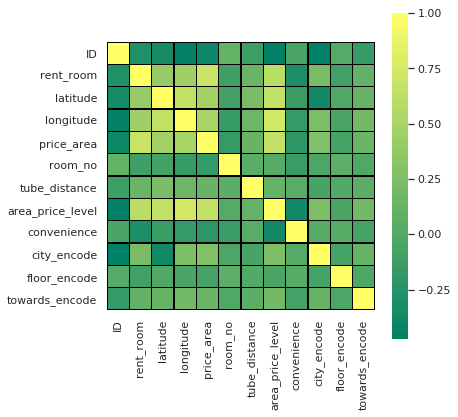

In [11]:
# A heat map was created to visualize the correlations between the variables in the dataset. The shade of color in the heat map indicates the strength of the correlation between the variables,
# with darker colors indicating stronger correlations and lighter colors indicating weaker correlations.
plt.figure(figsize=(6,6))
sns.heatmap(data.corr(),linewidths=0.1,linecolor='black',square=True,cmap='summer')

Next, let's use a pie chart to see the distribution of neighborhoods in the dataset

In [12]:
#  The Plotly library creates a pie chart to visualize the distribution of the number of listings near subway stations.
#  The pie chart uses subway stations as the label, and the number of listings corresponding to each subway station as the value, and you can intuitively see the proportion of the number of listings near each subway station through the pie chart.
number_of_room_in_tube = data['tube_name'].value_counts().sort_values(ascending=True)

dt = [go.Pie(
        labels = number_of_room_in_tube.index,
        values = number_of_room_in_tube.values,
        hoverinfo = 'label+value'
    
)]

plotly.offline.iplot(dt, filename='active_category')

In [13]:
# Based on the city information in the dataset, the data is divided into four subsets: Shanghai, Beijing, Shenzhen, and Guangzhou, and stored in the Shanghai,
# Beijing, Shenzhen, and Guangzhou variables. Then, the data from Guangdong was extracted, including Guangzhou and Shenzhen, and grouped according to the subway stations, keeping only the first record of each subway station, and finally storing the results in the guangdong variable.
#Finally, the number of data entries for each subset is output.
shanghai=data[data.city=='shanghai']
beijing=data[data.city=='beijing']
shenzhen=data[data.city=='shenzhen']
guangzhou=data[data.city=='guangzhou']

guangdong=data[(data.city=='guangzhou')|(data.city=='shenzhen')]
guangdong = guangdong.groupby('tube_name').first()

print(len(shanghai))
print(len(beijing))
print(len(shenzhen))
print(len(guangzhou))
print(len(guangdong))

275
176
215
819
20


Next, we'll see the listings on a map, with each listing marked with a label for the listing information that you can click to see the details of the listing

In [14]:
# An interactive Leaflet.js-based map was created using the Folium library. First of all, through folium.
# The Map() function creates a map object that specifies the initial location and zoom level of the map.
# Then, using the for loop, we traversed the dataset for the Shanghai area and created a circular marker for each data point.
# The radius and color of the markers are set according to the rent, with blue for high-priced rooms, gray for low-priced rooms, and green for low-priced rooms. Finally, through folium. The CircleMarker() function adds a circular marker to the map and sets the contents of the popup.
sh_map = folium.Map(location=[31.216199,121.469405],
                        zoom_start=12,
                   tiles="cartodbpositron")


for i in range(275):
    lat = shanghai['latitude'].iloc[i] 
    long = shanghai['longitude'].iloc[i] 
    radius = shanghai['rent_room'].iloc[i]/550 

    if shanghai['rent_room'].iloc[i] > 4500:
        color = "#008080"  # Blue is a high-priced room
    elif shanghai['rent_room'].iloc[i] < 3000:
        color = "#9BCD9B"  # Grey is a low-cost room
    else:
        color = "#9C9C9C"  # Green is a cheap room
    
    popup_text = """城市 : {}<br>
                楼层 : {}<br>
                租金 : {}<br>
                朝向 : {}<br>
                面积 : {}<br>
                房间数量 : {}<br>
                居住便利度 : {}<br>
                街区 : {}<br>"""
    popup_text = popup_text.format(shanghai['city_cn'].iloc[i] ,
                               shanghai['floor'].iloc[i] ,
                               shanghai['rent_room'].iloc[i] ,
                               shanghai['towards'].iloc[i] ,
                               shanghai['price_area'].iloc[i] ,
                               shanghai['room_no'].iloc[i],
                               shanghai['convenience'].iloc[i],
                               shanghai['tube_name'].iloc[i]
                               )
    folium.CircleMarker(location = [lat, long], popup= popup_text,radius = radius, color = color, fill = True).add_to(sh_map)

sh_map

In [15]:
gz_map = folium.Map(location=[23.133180,113.319719],
                        zoom_start=13,
                   tiles="CartoDB dark_matter")


for i in range(819):
    lat = guangzhou['latitude'].iloc[i] 
    long = guangzhou['longitude'].iloc[i] 
    radius = guangzhou['rent_room'].iloc[i]/490 

    if guangzhou['rent_room'].iloc[i] > 3000:
        color = "#008080"  # Blue is a high-priced room
    elif guangzhou['rent_room'].iloc[i] < 2000:
        color = "#CD950C"  # Brown is a low-cost room
    else:
        color = "#9C9C9C"  # Grey is a cheap room
    
    popup_text = """城市 : {}<br>
                楼层 : {}<br>
                租金 : {}<br>
                朝向 : {}<br>
                面积 : {}<br>
                房间数量 : {}<br>
                居住便利度 : {}<br>
                街区 : {}<br>"""
    popup_text = popup_text.format(guangzhou['city_cn'].iloc[i] ,
                               guangzhou['floor'].iloc[i] ,
                               guangzhou['rent_room'].iloc[i] ,
                               guangzhou['towards'].iloc[i] ,
                               guangzhou['price_area'].iloc[i] ,
                               guangzhou['room_no'].iloc[i],
                               guangzhou['convenience'].iloc[i],
                               guangzhou['tube_name'].iloc[i]
                               )
    folium.CircleMarker(location = [lat, long], popup= popup_text,radius = radius, color = color, fill = True).add_to(gz_map)

gz_map

In [16]:
sz_map = folium.Map(location=[22.540045,114.069211],
                        zoom_start=13,
                   tiles="cartodbpositron")


for i in range(215):
    lat = shenzhen['latitude'].iloc[i] 
    long = shenzhen['longitude'].iloc[i] 
    radius = shenzhen['rent_room'].iloc[i]/500 

    if shanghai['rent_room'].iloc[i] > 4500:
        color = "#008080"  # Blue is a high-priced room
    elif shanghai['rent_room'].iloc[i] < 3000:
        color = "#9BCD9B"  # Grey is a low-cost room
    else:
        color = "#9C9C9C"  # Green is a cheap room
    
    popup_text = """城市 : {}<br>
                楼层 : {}<br>
                租金 : {}<br>
                朝向 : {}<br>
                面积 : {}<br>
                房间数量 : {}<br>
                居住便利度 : {}<br>
                街区 : {}<br>"""
    popup_text = popup_text.format(shenzhen['city_cn'].iloc[i] ,
                               shenzhen['floor'].iloc[i] ,
                               shenzhen['rent_room'].iloc[i] ,
                               shenzhen['towards'].iloc[i] ,
                               shenzhen['price_area'].iloc[i] ,
                               shenzhen['room_no'].iloc[i],
                               shenzhen['convenience'].iloc[i],
                               shenzhen['tube_name'].iloc[i]
                               )
    folium.CircleMarker(location = [lat, long], popup= popup_text,radius = radius, color = color, fill = True).add_to(sz_map)

sz_map

Next, we draw a heat map of rents in Guangzhou and Shenzhen, which are not very obvious because of the scarcity of data

In [17]:
num = 20

lat = np.array(guangdong["latitude"][0:num])                       
lon = np.array(guangdong["longitude"][0:num])                        
rent_room = np.array(guangdong["area_price_level"][0:num],dtype=float)    


data1 = [[lat[i],lon[i],rent_room[i]] for i in range(num)]    

map_osm = folium.Map(location=[22.7,113.5],zoom_start=10)   
HeatMap(data1).add_to(map_osm) 

folium.TileLayer('cartodbpositron').add_to(map_osm)

map_osm

## LGBM

We use LightGBM to model house prices, first, we look at the variance and mean of the rent distribution

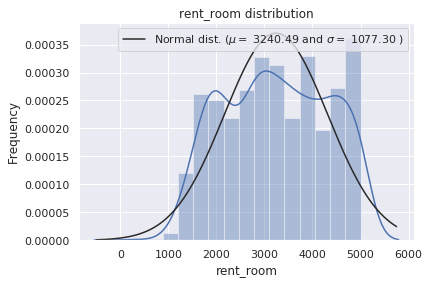

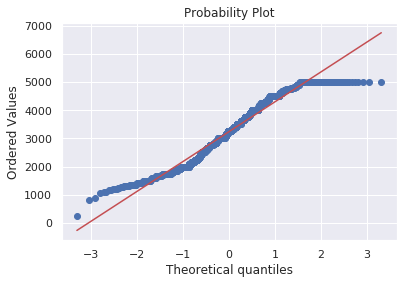

In [18]:
# Draw histograms and Q-Q plots of rent distributions. In the histogram, the distribution of the rent data is plotted by the sns.distplot() function, and the curve is fitted using the normal distribution. In the Q-Q plot, the quantiles of the rent data and the theoretical quantiles of the normal distribution are generated by the stats.probplot() function and plotted in the same plot for comparison. Eventually,
# the resulting graph is displayed via the plt.show() function.
sns.distplot(data['rent_room'] , fit=norm);

(mu, sigma) = norm.fit(data['rent_room'])

plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('rent_room distribution')

#Get QQ-plot
fig = plt.figure()
res = stats.probplot(data['rent_room'], plot=plt)
plt.show()


It can be seen that the housing price data as a whole shows a skewed distribution,
in which the listings below the price of 5,000 yuan approximately obey the normal distribution, while the listings near 5,000 yuan completely deviate from the normal distribution. Since the overall shift is not noticeable, we don't have to deal with it.


Next, we use the gradient boosting tree model LGBM model to model and analyze the factors that affect housing prices


First, we select features and divide the data into a training set and a validation set, with the test set being the previously screened dataset of fake listings


In [19]:
data.head()

,ID,city,floor,rent_room,towards,latitude,longitude,price_area,room_no,tube_distance,tube_name,area_price_level,convenience,city_cn,city_encode,floor_encode,towards_encode
0,29,shanghai,低楼层,5000.000000,南,31.239668,121.471921,151.515152,2,659.543339,上海人民广场,8666.666667,93.985965,上海,2,1,22
1,22614,shanghai,低楼层,3600.000000,南,31.231730,121.468079,180.000000,1,481.771180,上海人民广场,8666.666667,93.985965,上海,2,1,22
2,22619,shanghai,中楼层,4833.333333,南,31.238967,121.470462,105.839416,3,552.412127,上海人民广场,8666.666667,93.985965,上海,2,0,22
3,22936,shanghai,高楼层,4500.000000,南,31.233857,121.471158,121.621622,1,128.092605,上海人民广场,8666.666667,93.985965,上海,2,3,22
4,23431,shanghai,中楼层,4000.000000,南/北,31.238967,121.470462,118.518519,4,552.412127,上海人民广场,8666.666667,93.985965,上海,2,0,23


In [20]:
# Divide the dataset
col=['price_area', 'tube_distance','convenience', 'floor_encode', 'latitude', 'longitude','towards_encode']

X=data[col]
y=data['rent_room']

X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=0,test_size=0.2)

Next, we build the LGBM model and run it


In [21]:
# Import to LightGB matrix
lgb_train = lgb.Dataset(X_train, y_train, feature_name=col, categorical_feature=['floor_encode'])
lgb_test = lgb.Dataset(X_test, y_test, feature_name=col, categorical_feature=['floor_encode'], reference=lgb_train)

# Set the parameters
params = {'nthread': 4,  # Number of processes
              'objective': 'regression',
              'learning_rate':0.001,
              #'num_leaves': 1024, 
              #'max_depth': 10, 
              'feature_fraction': 0.7,  # Sample column sampling
              'lambda_l1':0.001,  # L1
              'lambda_l2': 0,  # L2 Regularization
              'bagging_seed': 100,  # Random seeds
              }
params['metric'] = ['rmse']

evals_result = {}  # Record the training results

print('开始训练...')
gbm_start=datetime.now() 
# train
gbm = lgb.train(params,
                lgb_train,
                num_boost_round=3000,
                valid_sets=[lgb_train, lgb_test],
                evals_result=evals_result,
                verbose_eval=10)
gbm_end=datetime.now() 
print('spendt time :'+str((gbm_end-gbm_start).seconds)+'(s)')

开始训练...
[10]	training's rmse: 1085.61	valid_1's rmse: 1008.17
[20]	training's rmse: 1078.64	valid_1's rmse: 1002.13
[30]	training's rmse: 1071.49	valid_1's rmse: 995.997
[40]	training's rmse: 1064.86	valid_1's rmse: 990.316
[50]	training's rmse: 1058.37	valid_1's rmse: 984.721
[60]	training's rmse: 1051.88	valid_1's rmse: 979.19
[70]	training's rmse: 1045.35	valid_1's rmse: 973.648
[80]	training's rmse: 1039.04	valid_1's rmse: 968.343
[90]	training's rmse: 1032.69	valid_1's rmse: 962.978
[100]	training's rmse: 1026.24	valid_1's rmse: 957.554
[110]	training's rmse: 1019.93	valid_1's rmse: 952.173
[120]	training's rmse: 1014.01	valid_1's rmse: 947.258
[130]	training's rmse: 1008.07	valid_1's rmse: 942.277
[140]	training's rmse: 1002.05	valid_1's rmse: 937.287
[150]	training's rmse: 996.21	valid_1's rmse: 932.421
[160]	training's rmse: 990.698	valid_1's rmse: 927.901
[170]	training's rmse: 984.91	valid_1's rmse: 923.113
[180]	training's rmse: 978.936	valid_1's rmse: 918.2
[190]	training's

Displays training errors and feature weights

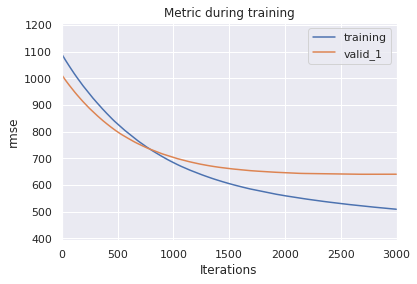

In [22]:
ax = lgb.plot_metric(evals_result, metric='rmse')
plt.show()

It can be seen that the model shows good generalization ability on the validation set


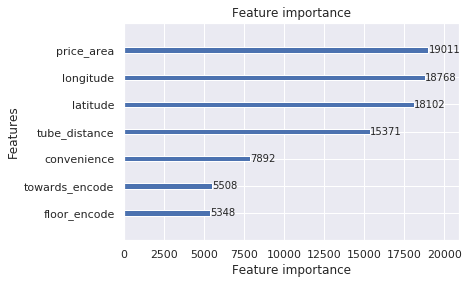

In [23]:
ax = lgb.plot_importance(gbm, max_num_features=7)
plt.show()

We built a model using LGBM and got the weights of each factor on house prices, and came to the following conclusions

- The size and location of the house are the main factors that affect the price of the house

- The influence of longitudinal characteristics on housing prices is greater than that of latitude characteristics

The latitude and longitude of each listing contains a lot of geographic information, such as city differences, neighborhood differences, etc., and the boosted tree model can learn these detailed differences through tree splitting. In this dataset, the overall housing price of Guangzhou is significantly lower than that of the other three cities, and the housing information of Guangzhou accounts for more than half of the dataset, among the four cities, Guangzhou is in the westernmost part and has obvious longitude characteristics, so the gradient boosting tree model will judge that the gain brought by the change of longitude features is greater than the change of latitude features when splitting the tree, so the weight of longitude features is higher.
Below, we plot the number of listings at different price points in each city on a scatter chart, with the horizontal axis representing the house price, and the vertical axis and scatter size representing the number of the house price:

In [24]:
df_counts = data.groupby(['rent_room', 'city_cn']).size().reset_index(name='counts')
px.scatter(df_counts,x="rent_room",y="counts",color='city_cn',size="counts",size_max=20)

- Ease of living and floor orientation have little impact on house prices

These four cities are the most developed first-tier cities in China, with a developed transportation network system and dense urban life squares, so we can see from the data statistics table that the average value of the convenience index is 97.3, and the variance is 3.26, and there is no obvious gap in the convenience index of each listing, and the convenience of living is not a key factor affecting housing prices.

In [25]:
data['convenience'].describe()

count    1485.000000
mean       97.281152
std         3.269421
min        84.794705
25%        96.943655
50%        98.340495
75%        99.136810
max        99.826370
Name: convenience, dtype: float64

# Predict house prices

Next, we use the model to predict the price of the fake listing and compare it to the original mark


First, let's compare the labeled house price and forecast representation of the original dataset in the same image

In [26]:
predict_lgb=gbm.predict(data[col]) 

data['rent_room_lgb']=predict_lgb

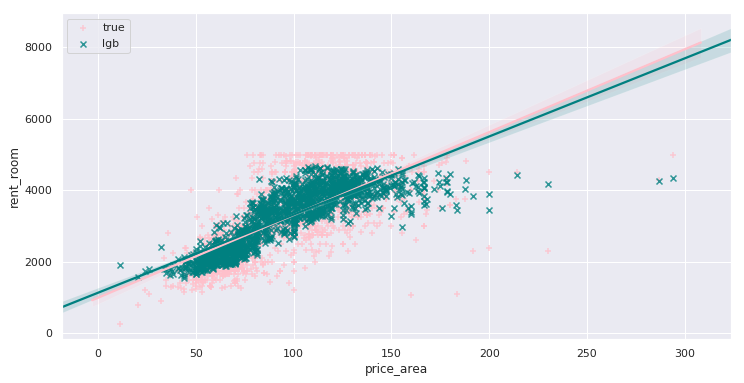

In [27]:
# The regression relationship between price area and rent is plotted. The real rent (marked with a pink plus sign) and the predicted rent (marked with a cyan cross) for the LGB model were plotted with the price area via the sns.regplot() function, respectively. The horizontal axis represents the price area, and the vertical axis represents the rent.
# Added a legend via the plt.legend() function
plt.figure(figsize=(12,6))
sns.regplot(data['price_area'],data['rent_room'],color='pink',label = 'true', marker = '+')
sns.regplot(data['price_area'],data['rent_room_lgb'],color='teal', label = 'lgb', marker = 'x')
plt.legend()
plt.xlabel('price_area')
plt.ylabel('rent_room')
plt.show()

It can be seen that the distribution of the prediction results is basically consistent with the distribution of the labels of the original dataset, which indicates that our prediction results are reasonable


Comparison of labeled and predicted rates with false listings


In [28]:
predict=gbm.predict(test[col]) 

test['rent_room_pre']=predict

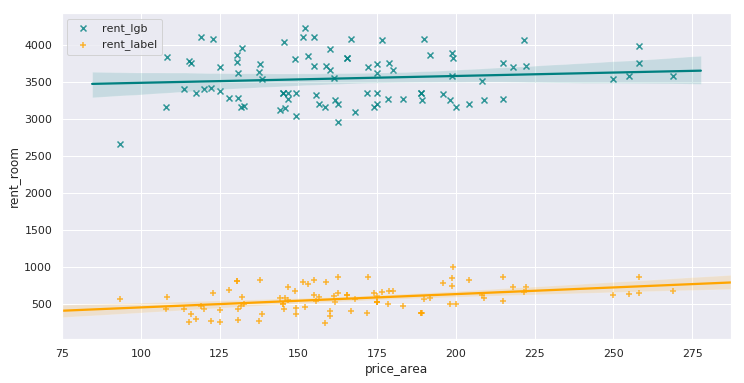

In [29]:
# The regression relationship between price area and rent is plotted. The sns.regplot() function plots the predicted rents (marked with cyan crosses) and real rents (marked with orange pluses) of the LGB model against the price area, respectively. The horizontal axis represents the price area, and the vertical axis represents the rent. A legend has been added via the plt.legend() function to make it possible to distinguish between predicted and true rents for LGB models.
# Finally, the resulting graph is displayed via the plt.show() function.
plt.figure(figsize=(12,6))
sns.regplot(test['price_area'],test['rent_room_pre'],color='teal', label = 'rent_lgb', marker = 'x')
sns.regplot(test['price_area'],test['rent_room'],color='orange',label = 'rent_label', marker = '+')
plt.legend()
plt.xlabel('price_area')
plt.ylabel('rent_room')
plt.show()

As you can see, the original labeled price of the fake listing is much lower than the predicted price, which also proves that we have no problem with the screening of fake listings before, and the credibility of these listings is very low, and there is a big problem

## Neural networks build housing price prediction models

When building the LGBM model, we only use one category feature floor, and the floor has little impact on house prices, next we build a neural network model to predict house prices, and we will build two neural network models:

- Multilayer neural network without embedding layers: In this neural network, we remove all class features and train only with continuous numeric features
- Neural network with embedding layer: The embedding layer can process categorical features into dense vectors, which we will train with 5 sequential numeric features and 2 categorical features

### Multi-layer neural network without embedding layers

In [30]:
col=['price_area', 'tube_distance','convenience', 'latitude', 'longitude']

X=data[col].values
y=data['rent_room'].values

X = X[:,0:5]
Y = y[:,]

In [31]:
# Randomly split the training set and the test set

train_X, test_X, train_y, test_y = train_test_split(X, Y, test_size=0.3)
 
# Fully connected neural networks
model = Sequential()
input = X.shape[1]
# Hidden layer 256
model.add(Dense(256, input_shape=(input,)))
model.add(Activation('relu'))
# The Dropout layer is used to prevent overfitting
model.add(Dropout(0.2))

# Hidden layer 128
model.add(Dense(128))
model.add(Activation('relu'))
model.add(Dropout(0.2))

# Hidden layer 64
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.2))

# The regression problem output layer does not require an activation function
model.add(Dense(1))
# The algorithm is optimized with ADAM and the optimized minimum mean square error loss function
model.compile(loss='mean_squared_error', optimizer=Adam())
# early stoppping
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=50, verbose=2)
# training
history = model.fit(train_X, train_y, epochs=80, batch_size=20, validation_data=(test_X, test_y), verbose=2, shuffle=False, callbacks=[early_stopping])


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.
Train on 1039 samples, validate on 446 samples
Epoch 1/80
 - 1s - loss: 4759443.6409 - val_loss: 1562234.4232
Epoch 2/80
 - 0s - loss: 1277275.8618 - val_loss: 763526.3142
Epoch 3/80
 - 0s - loss: 875510.3216 - val_loss: 699337.6312
Epoch 4/80
 - 0s - loss: 823007.4714 - val_loss: 663223.9254
Epoch 5/80
 - 0s - loss: 844972.3251 - val_loss: 645695.9204
Epoch 6/80
 - 0s - loss: 800320.6592 - val_loss: 654551.3491
Epoch 7/80
 - 0s - loss: 802517.7812 - val_loss: 622666.2656
Epoch 8/80
 - 0s - loss: 772039.2956 - val_loss: 613948.2571
Epoch 9/80
 - 0s - loss: 749462.4418 - val_loss: 612079.2979
Epoch 10/80
 - 0s - loss: 780433.9783 - val_loss: 617833.1717
Epoch 11/80
 - 0s - loss: 755089.6566 - val_loss: 603919.4608
Epoch 12/80
 - 0s - loss: 740076.1170 - va

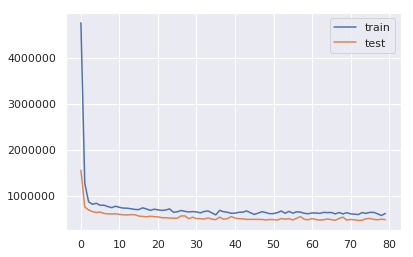

In [32]:
# loss curve
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

Test RMSE: 699.465


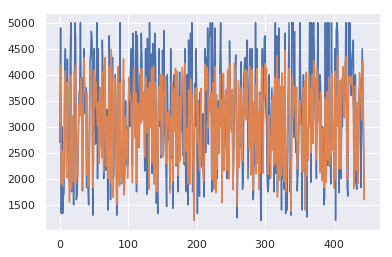

In [33]:
# forecast
yhat = model.predict(test_X)
# Prediction y inverse normalized
inv_yhat0 = concatenate((test_X, yhat), axis=1)
inv_yhat = inv_yhat0[:,-1]
# Original y-inverse normalization
test_y = test_y.reshape((len(test_y), 1))
inv_y0 = concatenate((test_X,test_y), axis=1)
inv_y = inv_y0[:,-1]
# Calculate the RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)
plt.plot(inv_y)
plt.plot(inv_yhat)
plt.show()

In [34]:
predict_nn=model.predict(data[col]) 

data['rent_room_pre_nn']=predict_nn

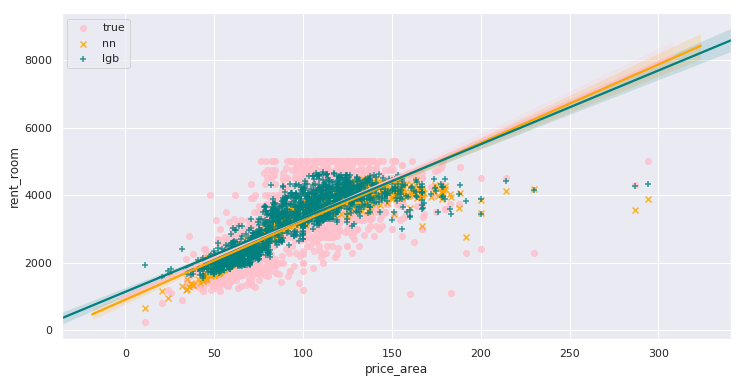

In [35]:
plt.figure(figsize=(12,6))
sns.regplot(data['price_area'],data['rent_room'],color='pink', label = 'true', marker = 'o')
sns.regplot(data['price_area'],data['rent_room_pre_nn'],color='orange',label = 'nn', marker = 'x')
sns.regplot(data['price_area'],data['rent_room_lgb'],color='teal',label = 'lgb',marker = '+')
plt.legend()
plt.xlabel('price_area')
plt.ylabel('rent_room')
plt.show()

## Multi-layer neural network with embedding layer

First of all, we need to create a neural network, for the embedding layer must be in the first layer of the network, and the category features and continuous features cannot count graphs at the same time, so we need to build the embedding layer first, and then stitch


In [36]:
def build_embedding_network():
 
    inputs = []
    embeddings = []
    
    
    input_cate_feature_1 = Input(shape=(1,))
    embedding = Embedding(4, 2, input_length=1)(input_cate_feature_1)
    embedding = Reshape(target_shape=(2,))(embedding)
    inputs.append(input_cate_feature_1)
    embeddings.append(embedding)
    
    input_cate_feature_2 = Input(shape=(1,))
    embedding = Embedding(39, 6, input_length=1)(input_cate_feature_2)
    embedding = Reshape(target_shape=(6,))(embedding)
    inputs.append(input_cate_feature_2)
    embeddings.append(embedding)
    
    input_numeric = Input(shape=(5,))
    embedding_numeric = Dense(256)(input_numeric) 
    inputs.append(input_numeric)
    embeddings.append(embedding_numeric)
 
    x = Concatenate()(embeddings)
   
    x = Dense(128, activation='relu')(x)
    x = Dropout(.15)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(.15)(x)
    
    output = Dense(1, activation='relu')(x)
    
    model = Model(inputs, output)
 
    model.compile(loss='mean_squared_error', optimizer=Adam())
    print(model.summary())
    
    return model

Next, we process the dataset into a special matrix to ensure that it can be fed into our neural network

In [37]:
col=['floor_encode', 'towards_encode', 'price_area', 'tube_distance','convenience', 'latitude', 'longitude']
cate1=['floor_encode']
cate2=['towards_encode']
cont=['price_area', 'tube_distance','convenience', 'latitude', 'longitude']

X=data[col].values
y=data['rent_room'].values

train_X, test_X, train_y, test_y = train_test_split(X, Y, test_size=0.3)

# 调整train数据集
tr_cate_feature_1 = train_X[:,0:1]
tr_cate_feature_2 = train_X[:,1:2]
tr_contious_feature = train_X[:,2:7]

tr_X = []
tr_X.append(tr_cate_feature_1)
tr_X.append(tr_cate_feature_2)
tr_X.append(tr_contious_feature)

tr_label = train_y[:,]
tr_Y = []
tr_Y.append(tr_label)

# 调整test数据集
te_cate_feature_1 = test_X[:,0:1]
te_cate_feature_2 = test_X[:,1:2]
te_contious_feature = test_X[:,2:7]

te_X = []
te_X.append(te_cate_feature_1)
te_X.append(te_cate_feature_2)
te_X.append(te_contious_feature)

te_label = test_y[:,]
te_Y = []
te_Y.append(te_label)

In [38]:
import tensorflow as tf
import random as rn
 
#random seeds for stochastic parts of neural network 
np.random.seed(10)
from tensorflow import set_random_seed
set_random_seed(15)
 
from keras.models import Model
from keras.layers import Input, Dense, Concatenate, Reshape, Dropout
from keras.layers.embeddings import Embedding

In [39]:
early_stopping = EarlyStopping(monitor='val_loss', patience=50, verbose=2)
embedding_nn = build_embedding_network()
history = embedding_nn.fit(tr_X, tr_Y, epochs=200, batch_size=20, validation_data=(te_X, te_Y), verbose=2, shuffle=False, callbacks=[early_stopping])

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 1, 2)         8           input_1[0][0]                    
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 1, 6)         234         input_2[0][0]                    
__________________________________________________________________________________________________
input_3 (I

Test RMSE: 788.722


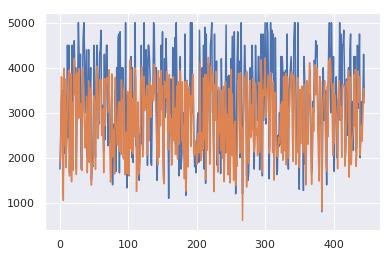

In [40]:
# forecast
yhat = embedding_nn.predict(te_X)
# Prediction y inverse normalized
inv_yhat0 = concatenate((test_X, yhat), axis=1)
inv_yhat = inv_yhat0[:,-1]
# Original y-inverse normalization
test_y = test_y.reshape((len(test_y), 1))
inv_y0 = concatenate((test_X,test_y), axis=1)
inv_y = inv_y0[:,-1]
# Calculate the RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)
plt.plot(inv_y)
plt.plot(inv_yhat)
plt.show()

Since we converted the dataset into a matrix with multiple concatencs after cross-validation, we need to re-replicate the original dataset and the test set into this special format and make predictions

In [41]:
col=['floor_encode', 'towards_encode', 'price_area', 'tube_distance','convenience', 'latitude', 'longitude']
cate1=['floor_encode']
cate2=['towards_encode']
cont=['price_area', 'tube_distance','convenience', 'latitude', 'longitude']

cate_feature_1 = data[cate1].values
cate_feature_2 = data[cate2].values
contious_feature = data[cont].values

TX = []
TX.append(cate_feature_1)
TX.append(cate_feature_2)
TX.append(contious_feature)

TY = data['rent_room'].values

preds_emnn = embedding_nn.predict(TX)[:,0]
data['rent_room_emnn'] = preds_emnn

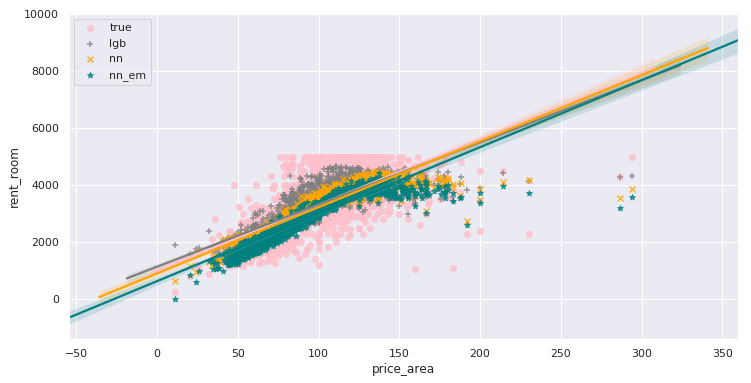

In [42]:
plt.figure(figsize=(12,6))
sns.regplot(data['price_area'],data['rent_room'],color='pink', label = 'true', marker = 'o')
sns.regplot(data['price_area'],data['rent_room_lgb'],color='gray',label = 'lgb',marker = '+')
sns.regplot(data['price_area'],data['rent_room_pre_nn'],color='orange',label = 'nn', marker = 'x')
sns.regplot(data['price_area'],data['rent_room_emnn'],color='teal',label = 'nn_em',marker = '*')
plt.legend()
plt.xlabel('price_area')
plt.ylabel('rent_room')
plt.show()

It can be seen that the effect of these three models is similar,
indicating that real estate agents and landlords also add some random and unpredictable unstable conditions to the pricing of houses in first-tier cities,
and further indicate that housing prices are susceptible to market and policy factors
